# Computer Vision Nanodegree

## Project: Image Captioning

---

In this notebook, you will use your trained model to generate captions for images in the test dataset.

This notebook **will be graded**.  

Feel free to use the links below to navigate the notebook:
- [Step 1](#step1): Get Data Loader for Test Dataset 
- [Step 2](#step2): Load Trained Models
- [Step 3](#step3): Finish the Sampler
- [Step 4](#step4): Clean up Captions
- [Step 5](#step5): Generate Predictions!

<a id='step1'></a>
## Step 1: Get Data Loader for Test Dataset

Before running the code cell below, define the transform in `transform_test` that you would like to use to pre-process the test images.  

Make sure that the transform that you define here agrees with the transform that you used to pre-process the training images (in **2_Training.ipynb**).  For instance, if you normalized the training images, you should also apply the same normalization procedure to the test images.

In [1]:
import sys
sys.path.append('/opt/cocoapi/PythonAPI')
from pycocotools.coco import COCO
from data_loader import get_loader
from torchvision import transforms

# TODO #1: Define a transform to pre-process the testing images.
transform_test = transforms.Compose([ 
    transforms.Resize(256),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406),
                         (0.229, 0.224, 0.225))])

#-#-#-# Do NOT modify the code below this line. #-#-#-#

# Create the data loader.
data_loader = get_loader(transform=transform_test,    
                         mode='test')

Vocabulary successfully loaded from vocab.pkl file!


Run the code cell below to visualize an example test image, before pre-processing is applied.

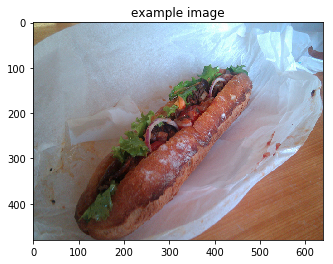

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Obtain sample image before and after pre-processing.
orig_image, image = next(iter(data_loader))

# Visualize sample image, before pre-processing.
plt.imshow(np.squeeze(orig_image))
plt.title('example image')
plt.show()

<a id='step2'></a>
## Step 2: Load Trained Models

In the next code cell we define a `device` that you will use move PyTorch tensors to GPU (if CUDA is available).  Run this code cell before continuing.

In [3]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Before running the code cell below, complete the following tasks.

### Task #1

In the next code cell, you will load the trained encoder and decoder from the previous notebook (**2_Training.ipynb**).  To accomplish this, you must specify the names of the saved encoder and decoder files in the `models/` folder (e.g., these names should be `encoder-5.pkl` and `decoder-5.pkl`, if you trained the model for 5 epochs and saved the weights after each epoch).  

### Task #2

Plug in both the embedding size and the size of the hidden layer of the decoder corresponding to the selected pickle file in `decoder_file`.

In [4]:
# Watch for any changes in model.py, and re-load it automatically.
%load_ext autoreload
%autoreload 2

import os
import torch
from model import EncoderCNN, DecoderRNN

# TODO #2: Specify the saved models to load.
encoder_file = "encoder-3.pkl" 
decoder_file = "decoder-3.pkl"

# TODO #3: Select appropriate values for the Python variables below.
embed_size = 256
hidden_size = 512

# The size of the vocabulary.
vocab_size = len(data_loader.dataset.vocab)

# Initialize the encoder and decoder, and set each to inference mode.
encoder = EncoderCNN(embed_size)
encoder.eval()
decoder = DecoderRNN(embed_size, hidden_size, vocab_size)
decoder.eval()

# Load the trained weights.
encoder.load_state_dict(torch.load(os.path.join('./models', encoder_file)))
decoder.load_state_dict(torch.load(os.path.join('./models', decoder_file)))

# Move models to GPU if CUDA is available.
encoder.to(device)
decoder.to(device)

DecoderRNN(
  (embed): Embedding(9955, 256)
  (lstm): LSTM(256, 512, batch_first=True)
  (linear): Linear(in_features=512, out_features=9955, bias=True)
)

<a id='step3'></a>
## Step 3: Finish the Sampler

Before executing the next code cell, you must write the `sample` method in the `DecoderRNN` class in **model.py**.  This method should accept as input a PyTorch tensor `features` containing the embedded input features corresponding to a single image.

It should return as output a Python list `output`, indicating the predicted sentence.  `output[i]` is a nonnegative integer that identifies the predicted `i`-th token in the sentence.  The correspondence between integers and tokens can be explored by examining either `data_loader.dataset.vocab.word2idx` (or `data_loader.dataset.vocab.idx2word`).

After implementing the `sample` method, run the code cell below.  If the cell returns an assertion error, then please follow the instructions to modify your code before proceeding.  Do **not** modify the code in the cell below. 

In [5]:
# Move image Pytorch Tensor to GPU if CUDA is available.
image = image.to(device)

# Obtain the embedded image features.
features = encoder(image).unsqueeze(1)

# Pass the embedded image features through the model to get a predicted caption.
output = decoder.sample(features)
print('example output:', output)

assert (type(output)==list), "Output needs to be a Python list" 
assert all([type(x)==int for x in output]), "Output should be a list of integers." 
assert all([x in data_loader.dataset.vocab.idx2word for x in output]), "Each entry in the output needs to correspond to an integer that indicates a token in the vocabulary."

example output: [0, 3, 966, 371, 21, 3, 4852, 6, 3, 4852, 39, 46, 18, 1, 3, 944, 18, 1, 46, 18]


<a id='step4'></a>
## Step 4: Clean up the Captions

In the code cell below, complete the `clean_sentence` function.  It should take a list of integers (corresponding to the variable `output` in **Step 3**) as input and return the corresponding predicted sentence (as a single Python string). 

In [6]:
# TODO #4: Complete the function.
def clean_sentence(output):
    list_string = []
    
    for idx in output:
        list_string.append(data_loader.dataset.vocab.idx2word[idx])
    
    list_string = list_string[1:-1]
    sentence = ' '.join(list_string)
    sentence = sentence.capitalize()
    return sentence

After completing the `clean_sentence` function above, run the code cell below.  If the cell returns an assertion error, then please follow the instructions to modify your code before proceeding.

In [7]:
sentence = clean_sentence(output)
print('example sentence:', sentence)

assert type(sentence)==str, 'Sentence needs to be a Python string!'

example sentence: A hot dog with a pickle and a pickle on it . <end> a drink . <end> it


<a id='step5'></a>
## Step 5: Generate Predictions!

In the code cell below, we have written a function (`get_prediction`) that you can use to use to loop over images in the test dataset and print your model's predicted caption.

In [8]:
def get_prediction():
    orig_image, image = next(iter(data_loader))
    plt.imshow(np.squeeze(orig_image))
    plt.title('Sample Image')
    plt.show()
    image = image.to(device)
    features = encoder(image).unsqueeze(1)
    output = decoder.sample(features)    
    sentence = clean_sentence(output)
    print(sentence)

Run the code cell below (multiple times, if you like!) to test how this function works.

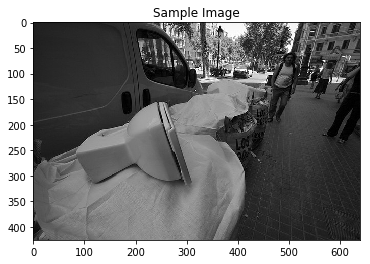

A man standing next to a bike on a sidewalk . <end> a blue and white sign .


In [9]:
get_prediction()

As the last task in this project, you will loop over the images until you find four image-caption pairs of interest:
- Two should include image-caption pairs that show instances when the model performed well.
- Two should highlight image-caption pairs that highlight instances where the model did not perform well.

Use the four code cells below to complete this task.

### The model performed well!

Use the next two code cells to loop over captions.  Save the notebook when you encounter two images with relatively accurate captions.

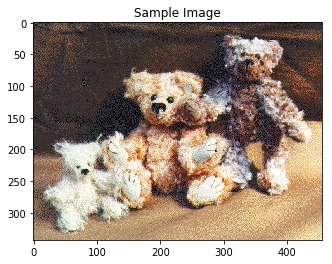

A stuffed animal is laying on a bed . <end> a picture . <end> . <end> his head


In [10]:
get_prediction()

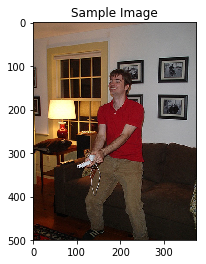

A man playing a game with a remote controller . <end> his face . <end> his face .


In [11]:
get_prediction()

### The model could have performed better ...

Use the next two code cells to loop over captions.  Save the notebook when you encounter two images with relatively inaccurate captions.

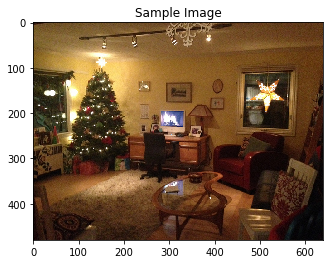

A living room with a couch , table and a television . <end> a window <end> to it


In [12]:
get_prediction()

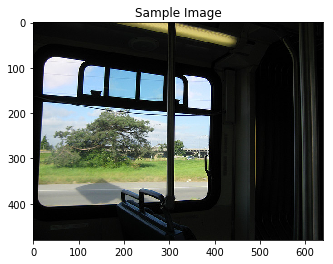

A train is parked on the tracks near a building . <end> the time . <end> the time


In [13]:
get_prediction()

In [14]:
def get_cam_prediction():
    image = get_camera_image()
    
    plt.imshow(np.squeeze(image))
    plt.title('Sample Image')
    plt.show()
    image = image.to(device)
    features = encoder(image).unsqueeze(1)
    output = decoder.sample(features)    
    sentence = clean_sentence(output)
    print(sentence)

In [15]:
%matplotlib inline
import cv2
import matplotlib.pyplot as plt

def get_camera_image():
    vc = cv2.VideoCapture(0)
    if vc.isOpened():
        is_capturing, frame = vc.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)    # makes the blues image look real colored
        vc.release()
        
        return frame

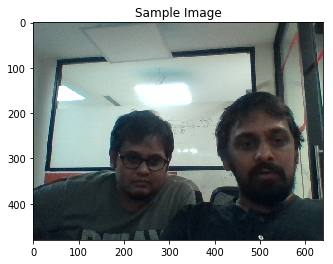

AttributeError: 'numpy.ndarray' object has no attribute 'to'

In [17]:
get_cam_prediction()

In [19]:
next(iter(data_loader))

[tensor([[[[175, 177, 176],
           [151, 153, 152],
           [131, 131, 131],
           ...,
           [206, 205, 201],
           [206, 205, 201],
           [206, 205, 201]],
 
          [[169, 171, 170],
           [171, 173, 170],
           [164, 164, 162],
           ...,
           [206, 205, 201],
           [206, 205, 201],
           [206, 205, 201]],
 
          [[171, 171, 169],
           [169, 169, 167],
           [173, 174, 169],
           ...,
           [206, 205, 200],
           [206, 205, 201],
           [206, 205, 201]],
 
          ...,
 
          [[106,  79,  49],
           [112,  83,  43],
           [116,  85,  57],
           ...,
           [ 71,  54,  36],
           [ 65,  48,  30],
           [ 76,  59,  43]],
 
          [[111,  81,  57],
           [109,  82,  55],
           [114,  86,  62],
           ...,
           [ 68,  50,  36],
           [ 74,  57,  39],
           [ 74,  58,  42]],
 
          [[110,  84,  47],
           [104,  80

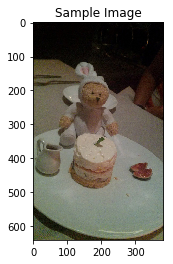

A cake with a plate of food on it . <end> a glass of wine . <end> it


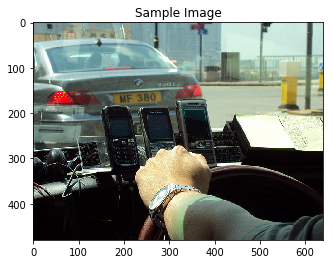

A dog is sitting on a motorcycle in the street . <end> <end> of a bag . <end>


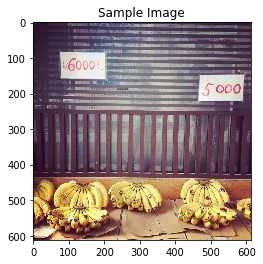

A bunch of bananas hanging from a tree . <end> a building . <end> <end> <unk> . <end>


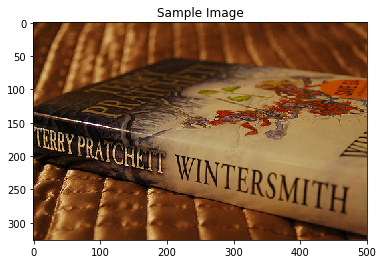

A pair of scissors on a table with a blanket . <end> it <end> out of it .


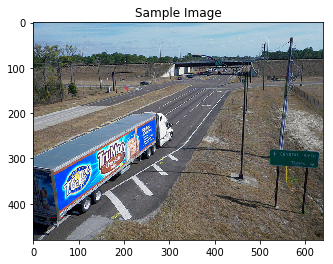

A couple of street signs are on a pole . <end> directions . <end> to the side .


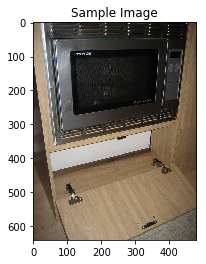

A microwave oven sitting on top of a counter . <end> a microwave . <end> it . <end>


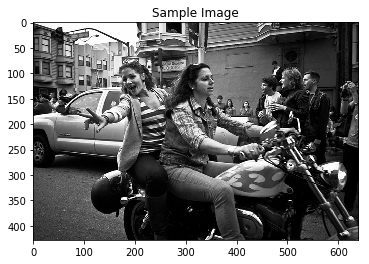

A woman sitting on a motorcycle in a parking lot . <end> a red light . <end> her


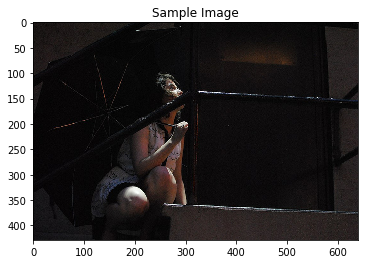

A man holding a cell phone in his hands . <end> his cell phone . <end> his cell


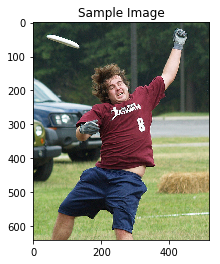

A man in a blue shirt and a yellow frisbee <end> his hands . <end> a trick .


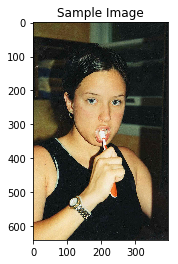

A man brushing his teeth with a toothbrush . <end> his head . <end> his head . <end>


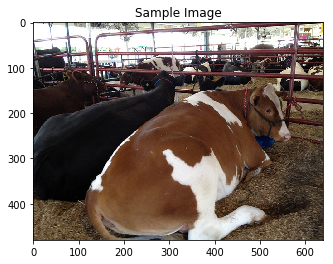

A cow is standing in a field with a cow . <end> it 's head . <end> to


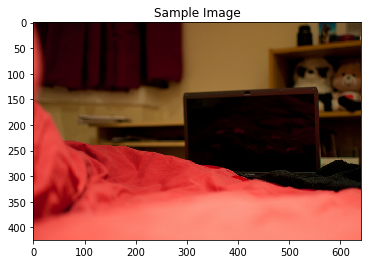

A laptop computer sitting on top of a bed . <end> a window . <end> a window .


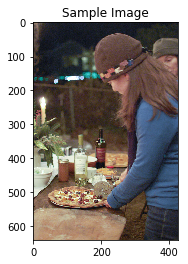

A man is holding a pizza with a knife . <end> it . <end> to the other .


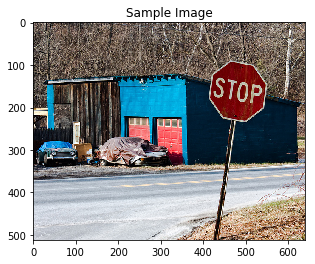

A stop sign is covered in snow and trees . <end> a tree . <end> the side of


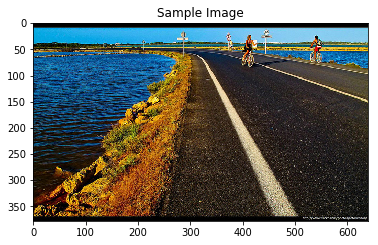

A person riding a bike with a dog on it . <end> out of the water . <end>


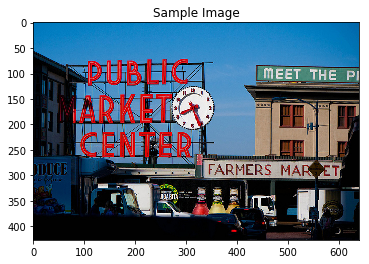

A large building with a clock on it . <end> a building . <end> it . <end> a


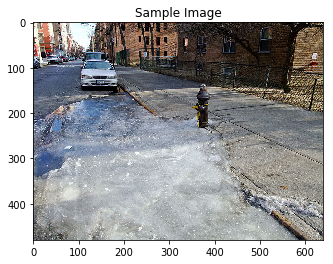

A man is riding a skateboard down the street . <end> a blue sky . <end> a blue


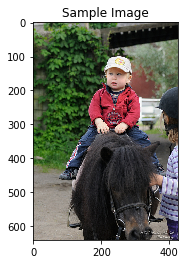

A man riding a horse in a forest . <end> a tree . <end> his head . <end>


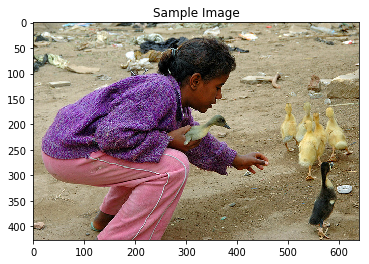

A man and a woman are feeding a bird . <end> a bird . <end> a tree .


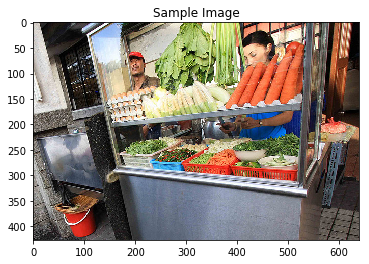

A man standing in front of a store filled with fruit . <end> a glass of wine .


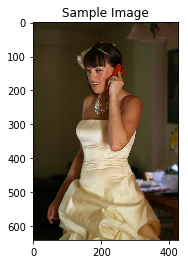

A woman holding a cell phone in her hand . <end> her face . <end> her face .


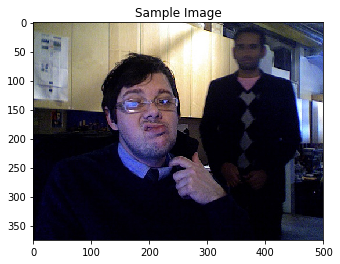

A man in a suit and tie is standing in front of a window . <end> a glass


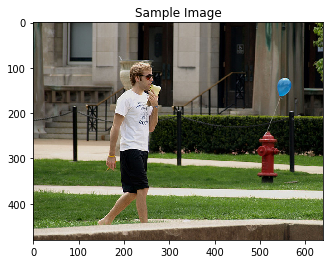

A man is standing on a skateboard in the street . <end> a trick . <end> his head


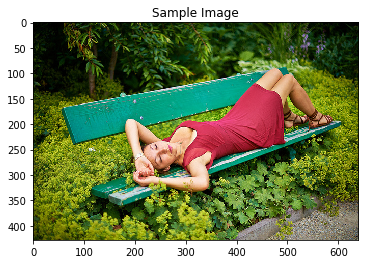

A woman sitting on a bench in a park . <end> her <end> . <end> her . <end>


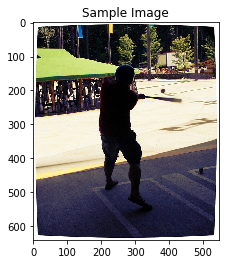

A man holding a skateboard with a woman in the background . <end> out of the window .


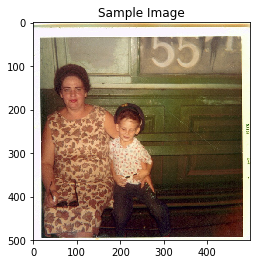

A man and woman playing a game with remote controllers . <end> <end> of them . <end> <end>


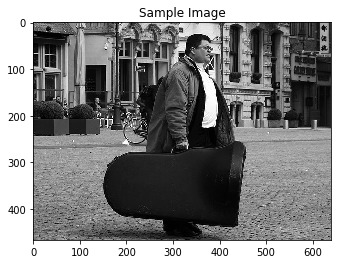

A man is sitting on a bench in the middle of the street . <end> a picture of


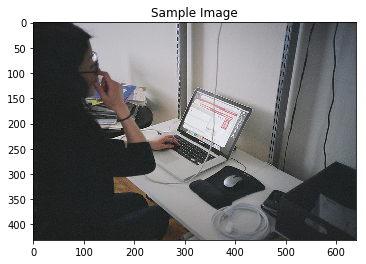

A computer and a laptop on a desk . <end> <end> of a <unk> . <end> to the


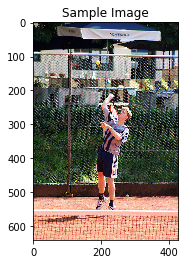

A man in a red shirt and a white shirt playing tennis . <end> a crowd . <end>


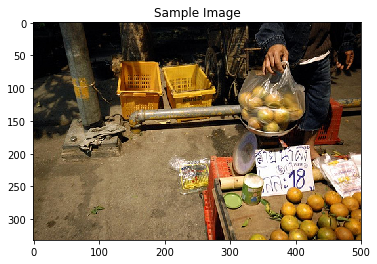

A man is standing next to a pile of bananas . <end> a sign . <end> the time


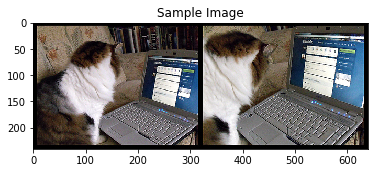

A cat laying on a laptop keyboard . <end> of a laptop . <end> a person <end> them


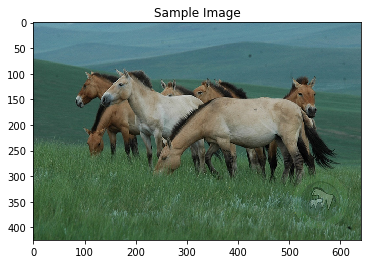

A couple of horses standing on top of a sandy beach . <end> to the other . <end>


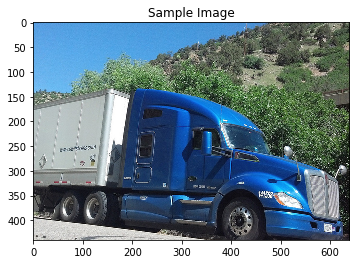

A red and white bus parked in a parking lot . <end> of a building . <end> out


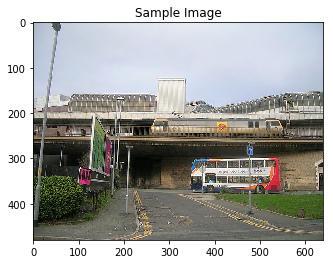

A large truck is parked on the side of the road . <end> of a building . <end>


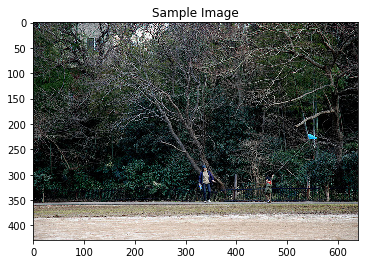

A man is flying a kite on a beach . <end> the sun . <end> . <end> out


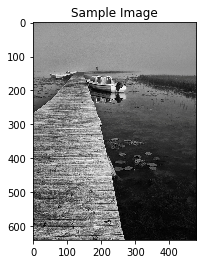

A boat is docked at the dock in the water . <end> the sun . <end> . <end>


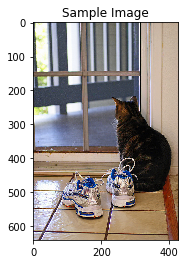

A cat sitting on a chair in front of a window . <end> a person . <end> a


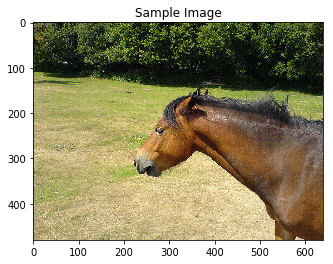

A horse standing next to a tree in a field . <end> a tree . <end> a tree


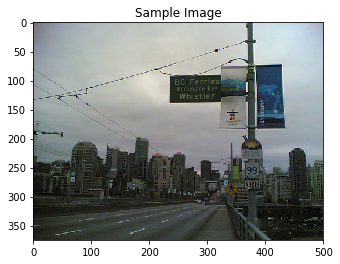

A street with cars and traffic lights on a street . <end> directions . <end> sign . <end>


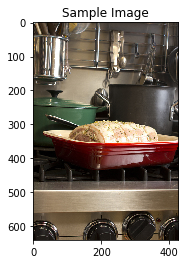

A bowl of food on a table next to a bowl of fruit . <end> a glass .


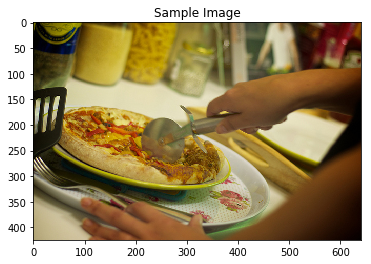

A man is cutting a piece of pizza . <end> a fork . <end> out of the oven


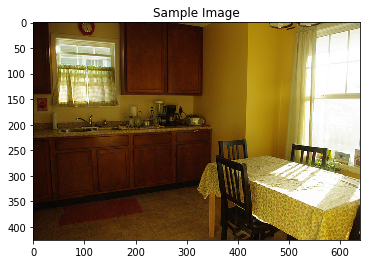

A living room with a couch , table and a chair . <end> it . <end> a window


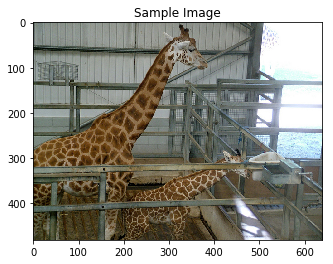

A giraffe standing next to a fence in a fenced enclosure . <end> a tree . <end> a


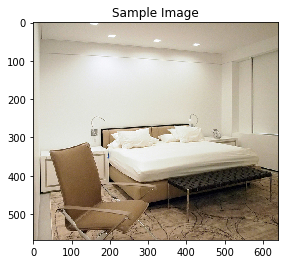

A small bathroom with a large mirror and a sink . <end> it . <end> to the side


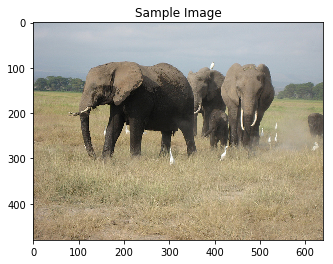

A group of elephants standing in a field . <end> of trees . <end> to a tree .


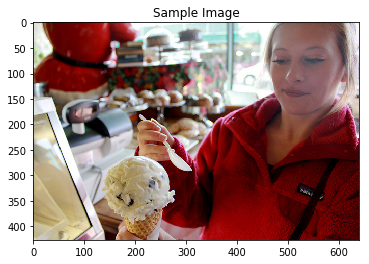

A woman holding a plate of food on a table . <end> food <end> out of a restaurant


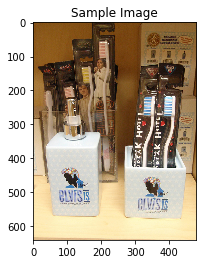

A group of ties are lined up on a table . <end> a picture of a man .


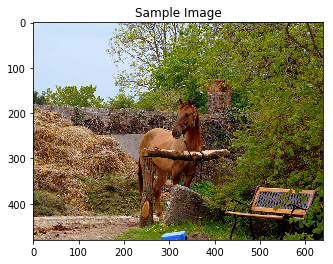

A horse standing in a field with a tree in the background . <end> it . <end> to


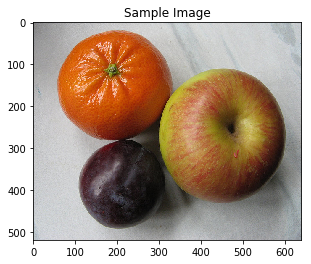

A bowl of fruit is sitting on a table . <end> a glass of water . <end> it


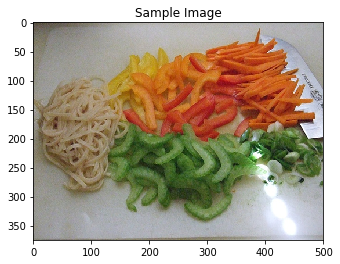

A plate of food with a fork and knife on it . <end> a fork . <end> it


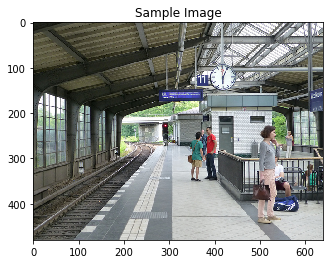

A man is standing on a train platform . <end> a train . <end> <end> . <end> .


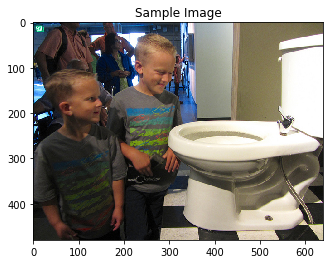

A man in a bathroom with a toilet and a sink . <end> it . <end> to the


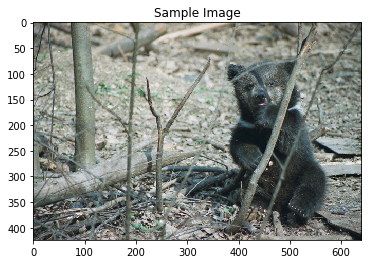

A black bear walking across a lush green field . <end> a tree . <end> a tree .


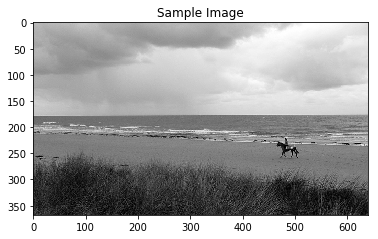

A person standing on a beach flying a kite . <end> out of the water . <end> the


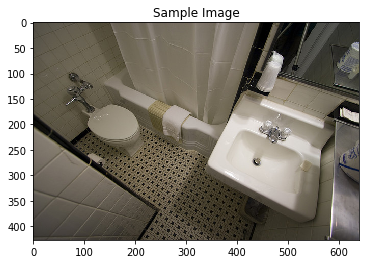

A bathroom with a toilet and a sink <end> out of the window . <end> it . <end>


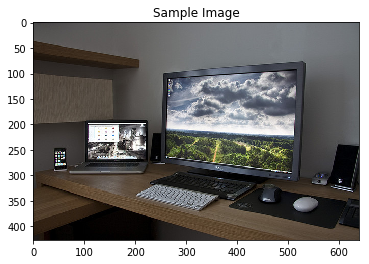

A computer monitor sitting on top of a desk . <end> a glass . <end> it . <end>


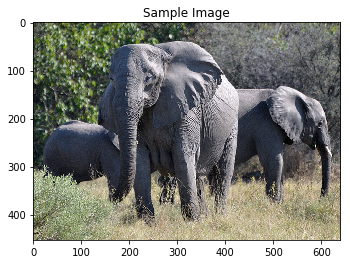

A large elephant standing in a field with a sky background <end> the background . <end> it .


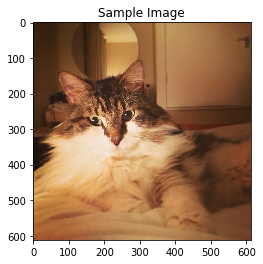

A cat is sitting on a toilet seat . <end> of the other . <end> out of the


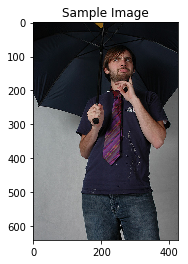

A woman holding a cell phone in her hand . <end> her head . <end> her head .


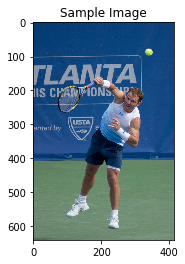

A man in a blue shirt and white shorts playing tennis . <end> a blue and white ball


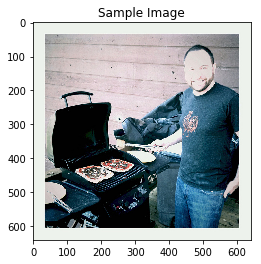

A man sitting at a table with a laptop . <end> his face . <end> his face .


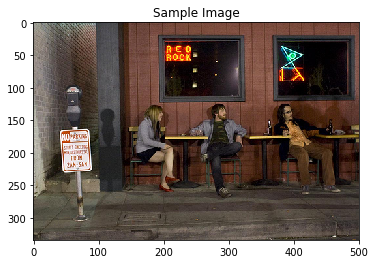

A man is sitting on a bench in front of a building . <end> a woman 's head


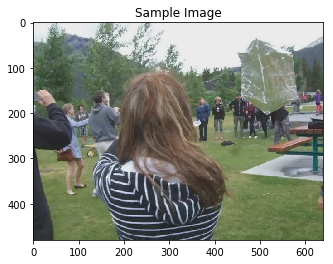

A woman standing next to a horse in a park . <end> a woman . <end> her head


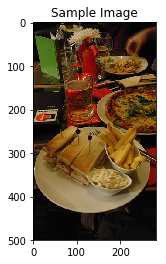

A table with plates of food and a bowl of soup . <end> it <end> out of it


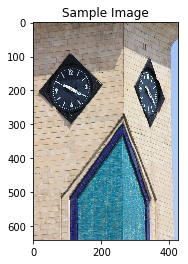

A clock that is on top of a building . <end> a building . <end> the time .


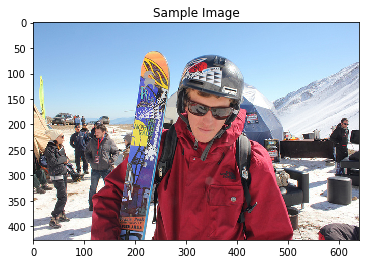

A group of people standing on top of a snow covered slope . <end> a skier . <end>


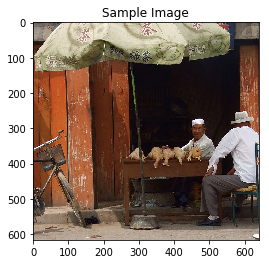

A man is standing in front of a door . <end> a woman 's head . <end> a


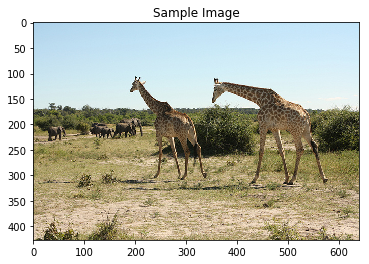

Two giraffes standing in a field with trees in the background . <end> to eat . <end> to


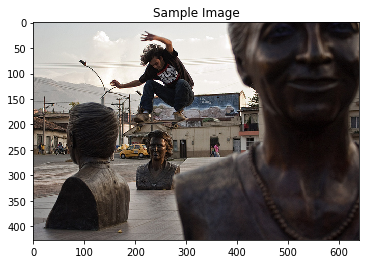

A man is riding a skateboard on a ramp . <end> a building . <end> it . <end>


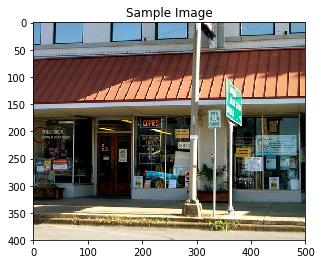

A woman standing next to a sign on a street . <end> directions . <end> <end> . <end>


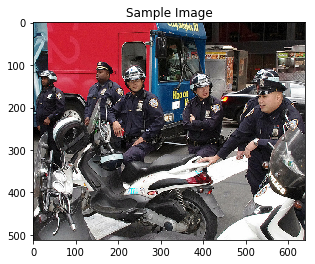

A man riding a motorcycle down a street . <end> a crowd . <end> to the bus .


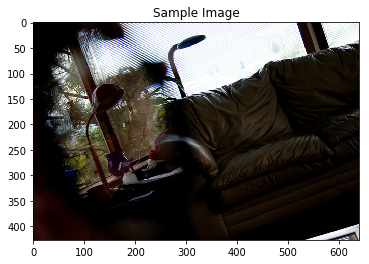

A person sitting on a bench with a dog . <end> <end> . <end> his head . <end>


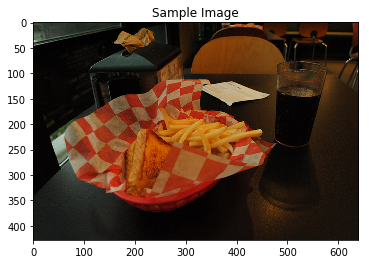

A sandwich on a plate with a pickle and a cup of coffee . <end> it . <end>


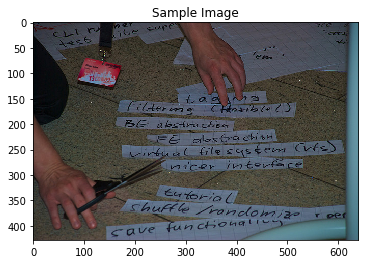

A man holding a skateboard with a black and white dog . <end> it . <end> his head


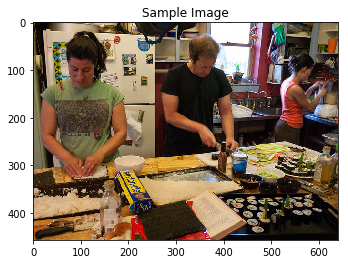

A man is cutting a cake with a knife . <end> it . <end> to the side .


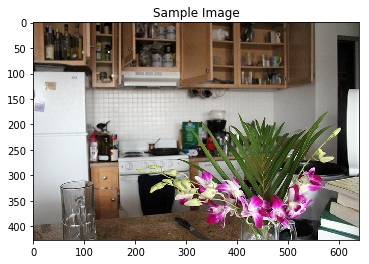

A kitchen with a stove and a sink . <end> it <end> to the oven . <end> to


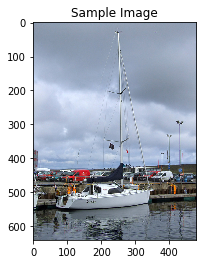

A boat floating on top of a body of water . <end> a blue sky . <end> it


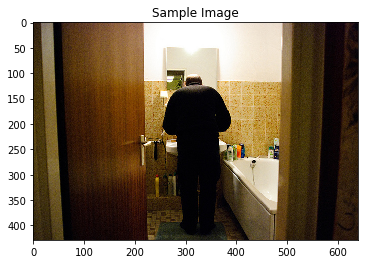

A man in a bathroom brushing his teeth . <end> a mirror . <end> his head . <end>


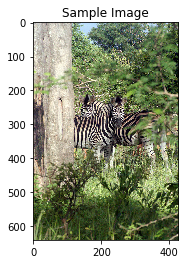

A zebra standing in a field of grass . <end> to eat . <end> to eat . <end>


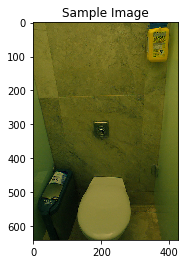

A bathroom with a toilet and a sink . <end> it . <end> it . <end> to the


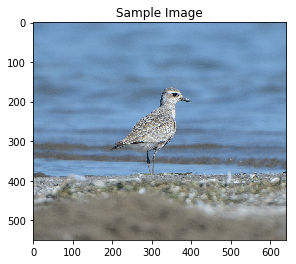

A bird standing on a beach next to a body of water . <end> water . <end> it


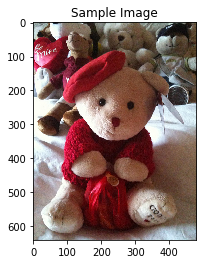

A teddy bear with a book on its back . <end> a teddy bear . <end> the side


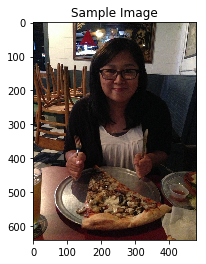

A man is preparing a pizza at a restaurant . <end> to eat . <end> to the other


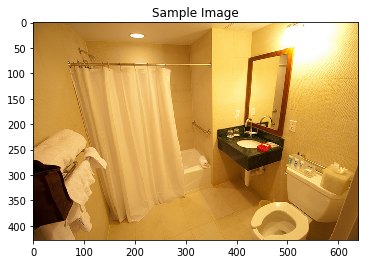

A bathroom with a large mirror and a sink . <end> it . <end> to the side .


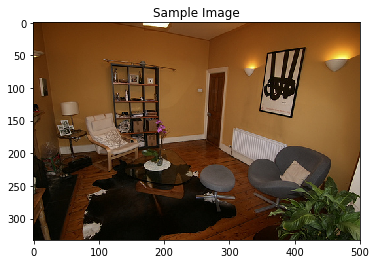

A living room with a couch , table , and a television . <end> it . <end> a


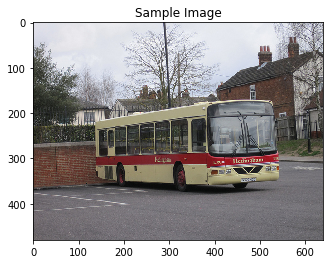

A double decker bus is parked on the side of the road . <end> . <end> out the


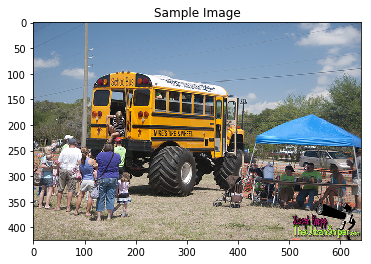

A man and a woman standing next to a fire hydrant . <end> to the side . <end>


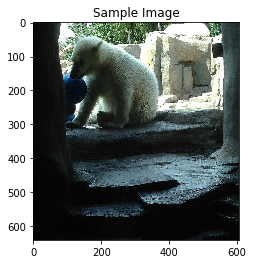

A polar bear is walking on a rock . <end> to the ground . <end> to see .


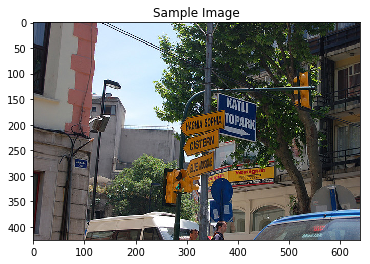

A street sign is on a pole in the city . <end> . <end> . <end> . <end>


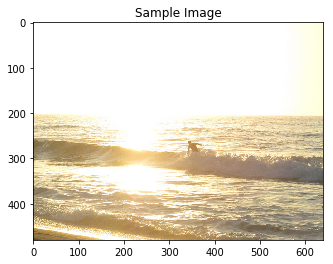

A person on a surfboard in the water . <end> a blue sky . <end> the sun .


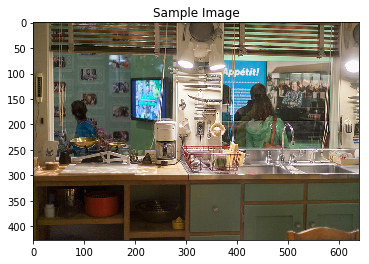

A man is standing in a kitchen preparing food . <end> the other food . <end> the other


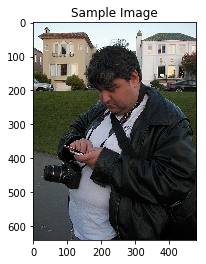

A man in a suit and tie sitting on a bench . <end> <end> of food . <end>


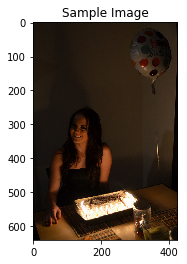

A woman holding a wii remote in her hand . <end> her face . <end> her face .


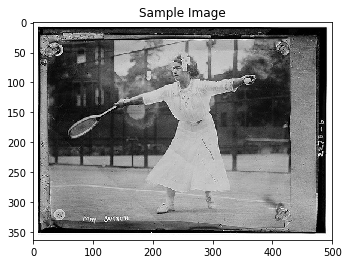

A man is standing on a skateboard in the air . <end> a trick . <end> his head


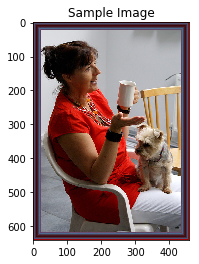

A woman holding a dog in her mouth . <end> her face . <end> her face . <end>


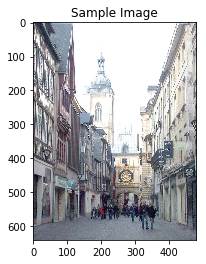

A city street with a large clock tower . <end> it 's sides . <end> it is a


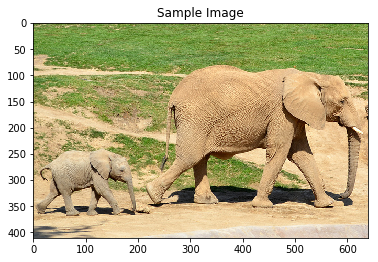

A large elephant standing on top of a dirt field . <end> to a tree . <end> to


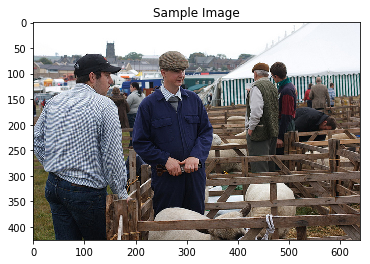

A man is sitting on a bench with a dog . <end> it . <end> <end> . <end>


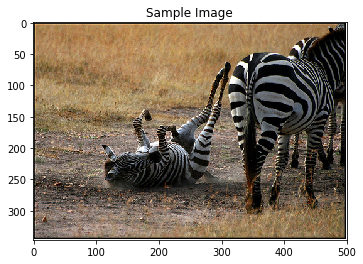

A group of zebras standing in a field . <end> of a tree . <end> a tree .


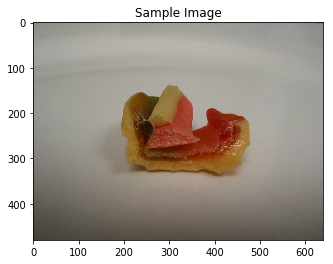

A plate with a piece of cake and a fork . <end> it <end> out of it <end>


In [20]:
for i in range(100):
    get_prediction()